In [1]:
import skimage as sk
import skimage.io as skio
from scipy import signal
import numpy as np
from scipy import ndimage
import matplotlib.pyplot as plt
import cv2
from skimage import io

### 1.1 Finite Defference Operator

In [2]:
imname = 'cameraman.png'
im = skio.imread(imname)[:,:,1]

In [3]:
dx = np.array([[1, -1]])
dy = np.array([[1], [-1]])

In [4]:
grad_dx = signal.convolve2d(im, dx, mode='same')
grad_dy = signal.convolve2d(im, dy, mode='same')
grad_combine = np.sqrt(np.square(grad_dx)+np.square(grad_dy))

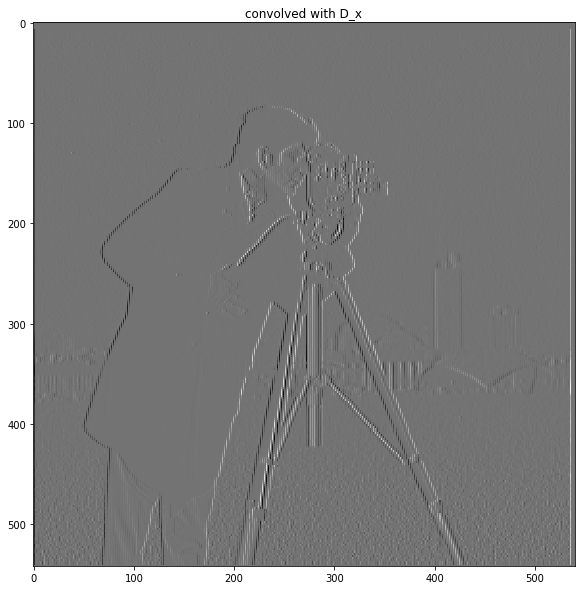

In [5]:
plt.figure(figsize=(10,10))
plt.title('convolved with D_x')
plt.imshow(grad_dx,cmap='gray')

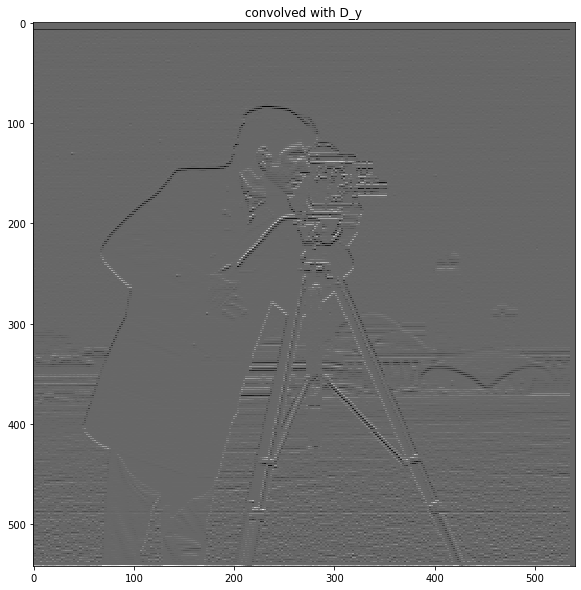

In [6]:
plt.figure(figsize=(10,10))
plt.title('convolved with D_y')
plt.imshow(grad_dy,cmap='gray')

Lossy conversion from float64 to uint8. Range [0.0, 360.62445840513925]. Convert image to uint8 prior to saving to suppress this warning.


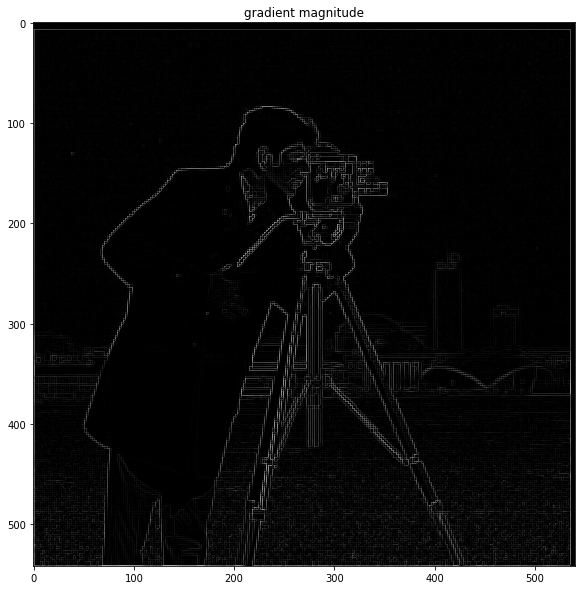

In [7]:
plt.figure(figsize=(10,10))
plt.title('gradient magnitude')
plt.imshow(np.absolute(grad_combine),cmap='gray')
io.imsave('gradient_mag.png', np.absolute(grad_combine))

Lossy conversion from float64 to uint8. Range [0.0, 360.62445840513925]. Convert image to uint8 prior to saving to suppress this warning.


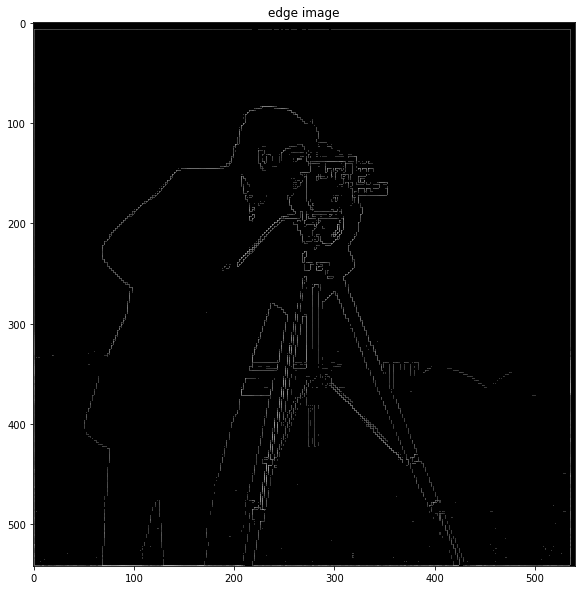

In [8]:
def edge_image(image, threshold):
    image = np.absolute(image)
    image[image < threshold] = 0
    return image
plt.figure(figsize=(10,10))
plt.title('edge image')
plt.imshow(edge_image(grad_combine, 70), cmap='gray')
io.imsave('edge.png', edge_image(grad_combine, 70))

### 1.2 Derivative of Gaussian (DoG) Filter


In [9]:
def make_gaussian_filter(filter_size, sigma=1):
    a = cv2.getGaussianKernel(filter_size, sigma)
    return np.outer(a, a.T)

In [10]:
gaussian_filter = make_gaussian_filter(8, sigma=2)
blurred = signal.convolve2d(im, gaussian_filter, mode='same')

In [11]:
blur_grad_dx = signal.convolve2d(blurred, dx, mode='same')
blur_grad_dy = signal.convolve2d(blurred, dy, mode='same')
blur_grad_combine = np.sqrt(np.square(blur_grad_dx)+np.square(blur_grad_dy))

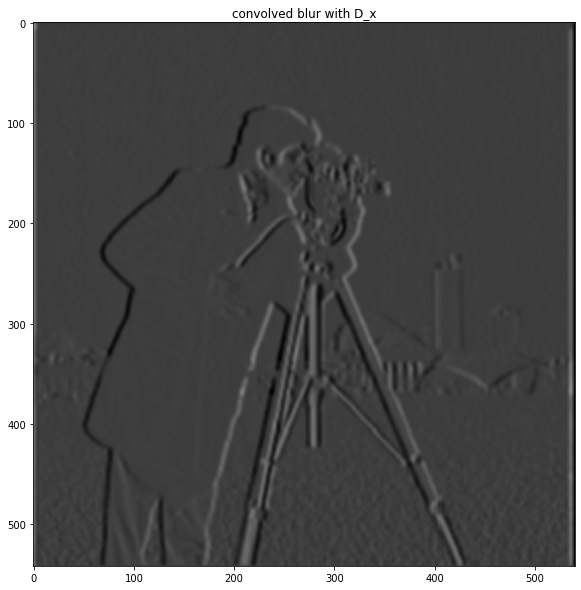

In [12]:
plt.figure(figsize=(10,10))
plt.title('convolved blur with D_x')
plt.imshow(blur_grad_dx,cmap='gray')

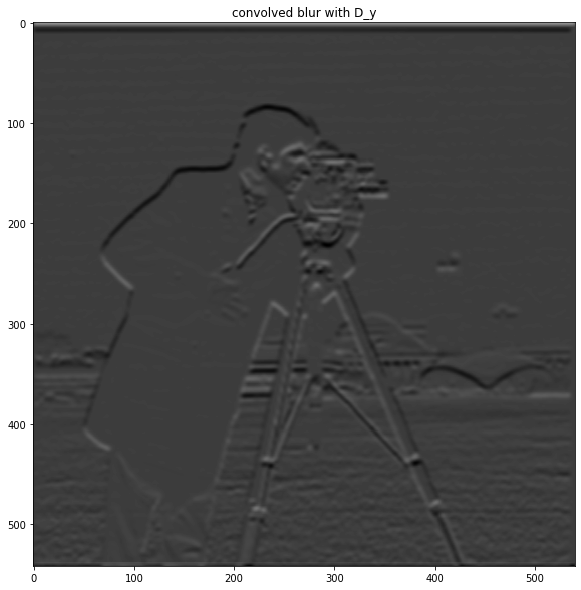

In [13]:
plt.figure(figsize=(10,10))
plt.title('convolved blur with D_y')
plt.imshow(blur_grad_dy,cmap='gray')

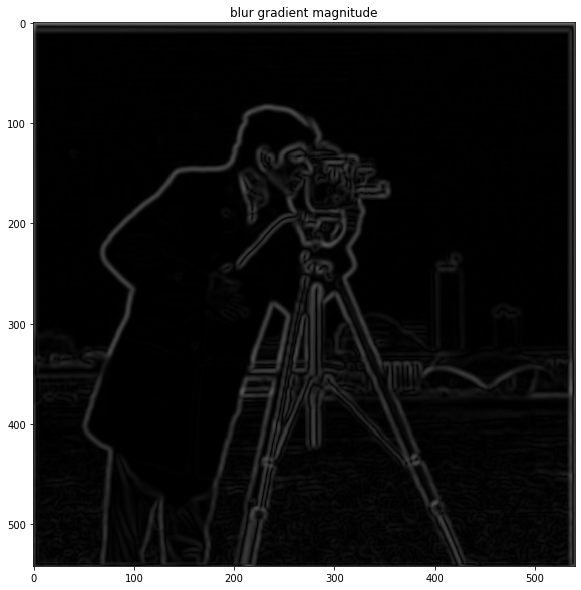

In [14]:
plt.figure(figsize=(10,10))
plt.title('blur gradient magnitude')
plt.imshow(np.absolute(blur_grad_combine),cmap='gray')

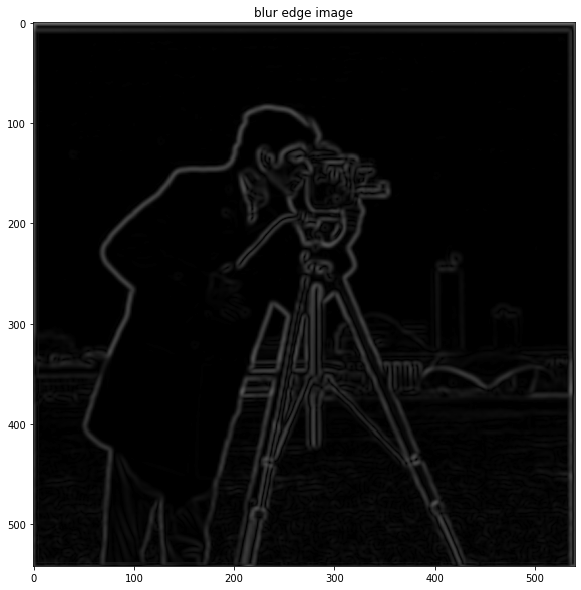

In [15]:
plt.figure(figsize=(10,10))
plt.title('blur edge image')
plt.imshow(edge_image(blur_grad_combine, 1), cmap='gray')

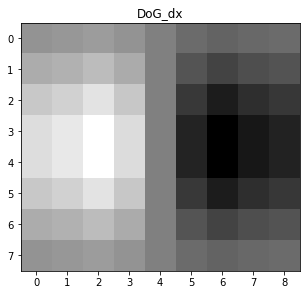

In [16]:
## now we convolve gaussian with dx dy
DoG_dx = signal.convolve2d(gaussian_filter, dx)
DoG_dy = signal.convolve2d(gaussian_filter, dy)
plt.figure(figsize=(5,5))
plt.title('DoG_dx')
plt.imshow(DoG_dx, cmap='gray')

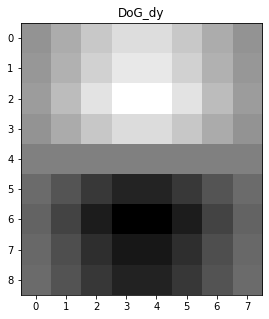

In [17]:
plt.figure(figsize=(5,5))
plt.title('DoG_dy')
plt.imshow(DoG_dy, cmap='gray')

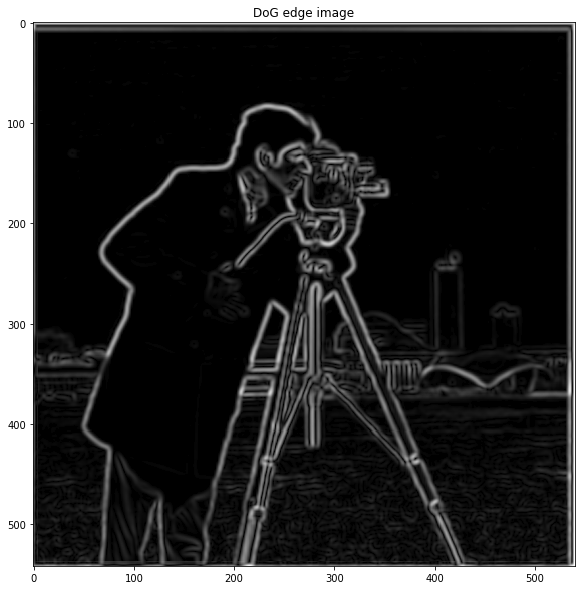

In [18]:
DoG_dx_im = signal.convolve2d(im, DoG_dx, mode='same')
DoG_dy_im = signal.convolve2d(im, DoG_dy, mode='same')
DoG_result = np.sqrt(np.square(DoG_dx_im)+np.square(DoG_dy_im))
plt.figure(figsize=(10,10))
plt.title('DoG edge image')
plt.imshow(edge_image(DoG_result, 1), cmap='gray')

### 1.3 Image Straightening

In [19]:
facade = 'facade.jpg'
facade = skio.imread(facade)

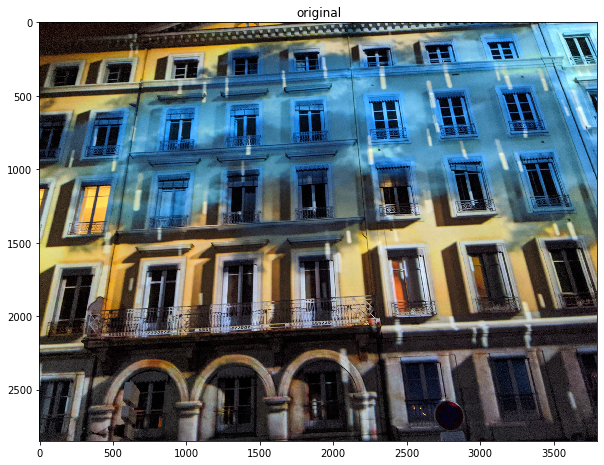

In [20]:
plt.figure(figsize=(10,10))
plt.title("original")
plt.imshow(facade)

In [21]:
def crop_center(image):
    a = image.shape[0]//2-image.shape[0]//4
    c = image.shape[1]//2-image.shape[1]//4
    return image[a:-a, c:-c]

def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])

def gradient_angle(image):
    d_x = np.array([[1, -1]])
    d_y = np.array([[1], [-1]])
    gaussian = cv2.getGaussianKernel(10, 2)
    filter = np.outer(gaussian, gaussian.T)
    image = signal.convolve2d(image, filter, mode='same') 
    Dx = signal.convolve2d(image, d_x, mode='same') 
    Dy = signal.convolve2d(image, d_y, mode='same')
    Dx = np.ndarray.flatten(Dx)
    Dy = np.ndarray.flatten(Dy)
    angles = np.degrees(np.arctan2(Dy,Dx)) 
    return angles

def count_edge(grad_angle):
    degree_0 = np.count_nonzero(np.absolute(grad_angle-0)<1) 
    degree_90 = np.count_nonzero(np.absolute(grad_angle-90)<1) 
    degree_180 = np.count_nonzero(np.absolute(grad_angle-180)<1)
    degree_181 = np.count_nonzero(np.absolute(grad_angle-(-180))<1)
    degree_270 = np.count_nonzero(np.absolute(grad_angle-(-90))<1)
    return degree_0 + degree_90 + degree_180 +  degree_181 + degree_270

def rotate(image, rotate_range=[-10, 10], step=2):
    gray = rgb2gray(image)
    angles = np.arange(rotate_range[0], rotate_range[1], step)
    best_angle = rotate_range[0]
    best_count = -1
    for angle in angles:
        rotated_center = crop_center(ndimage.interpolation.rotate(gray, angle))
        plt.title("rotate degree: "+str(angle))
        plt.imshow(rotated_center)
        plt.show()
        gradient_angs = gradient_angle(rotated_center)
        plt.title("rotate degree: "+str(angle)+" hist")
        plt.hist(gradient_angs, 80)
        plt.show()
        counted_edges = count_edge(gradient_angs)
        print(counted_edges)
        if counted_edges > best_count:
            best_count = counted_edges
            best_angle = angle
    print("Best angle: ", best_angle)
    return ndimage.interpolation.rotate(image, best_angle)

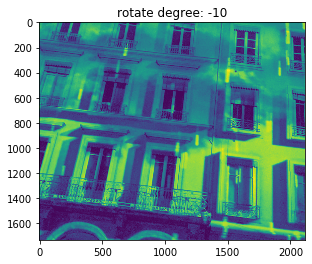

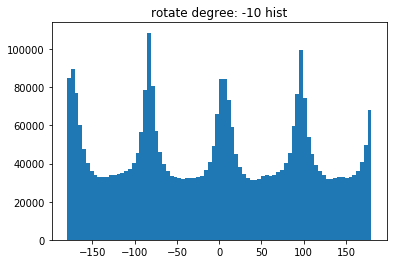

131995


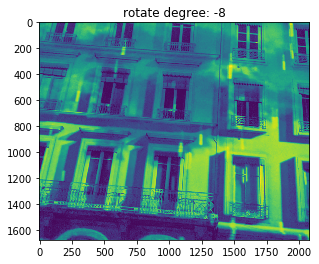

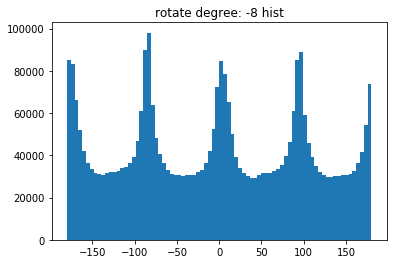

139856


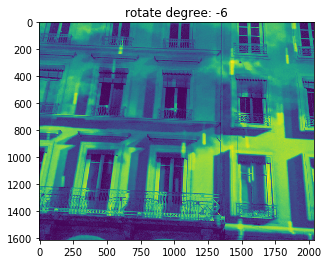

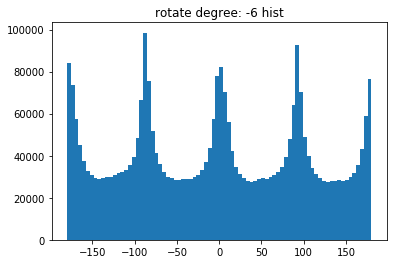

146748


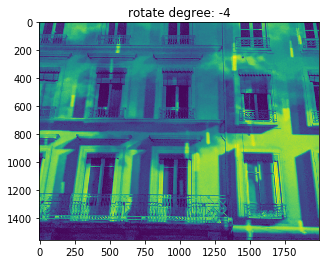

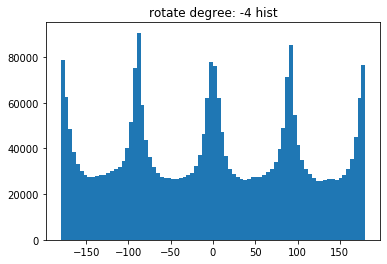

156777


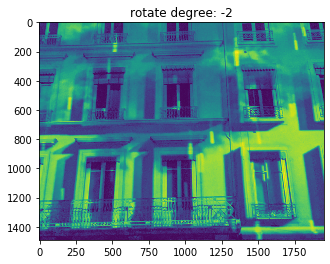

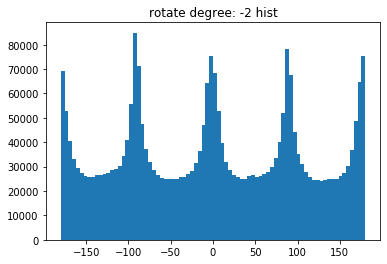

147525


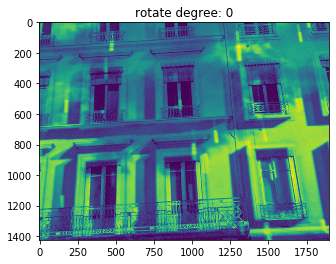

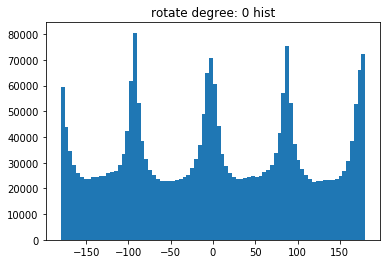

120960


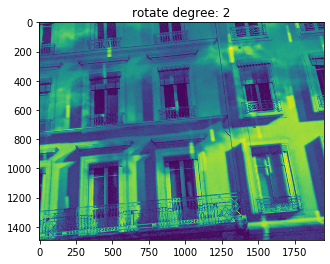

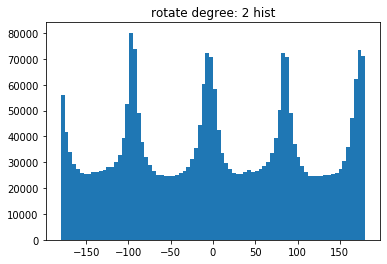

111679


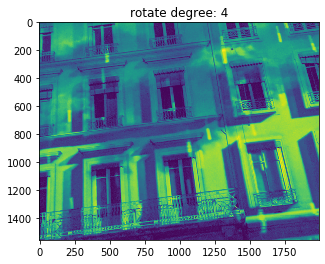

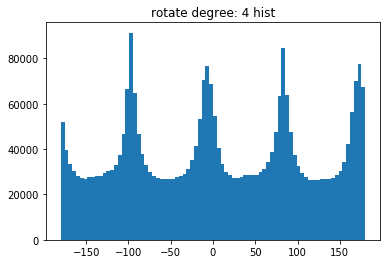

104553


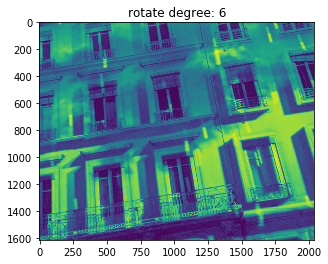

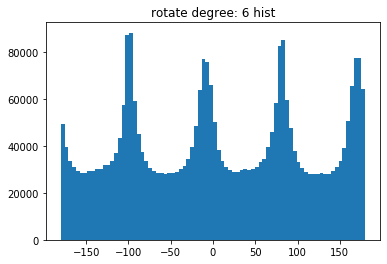

99829


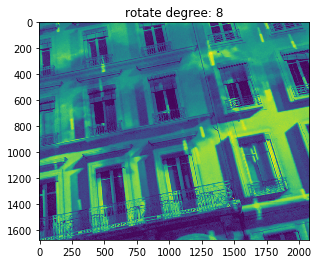

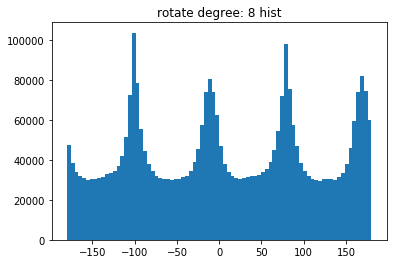

95600
Best angle:  -4


In [22]:
rotated_facade = rotate(facade)

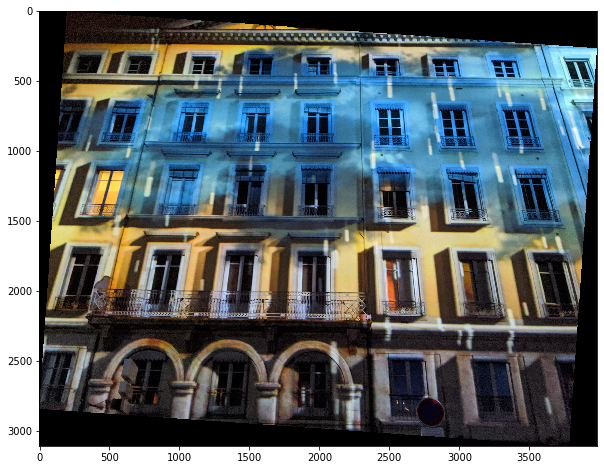

In [23]:
plt.figure(figsize=(10,10))
plt.imshow(rotated_facade)

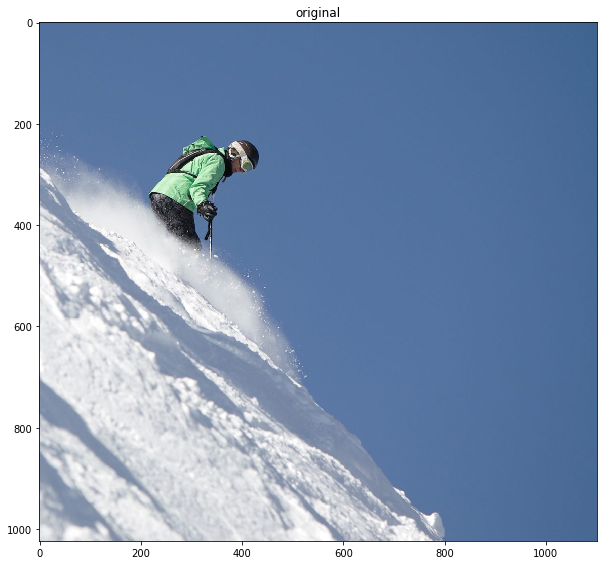

In [24]:
ski = 'ski.jpg'
ski = skio.imread(ski)
plt.figure(figsize=(10,10))
plt.title("original")
plt.imshow(ski)

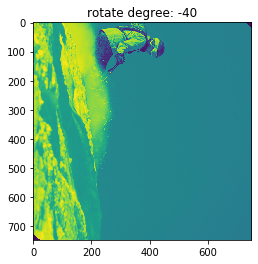

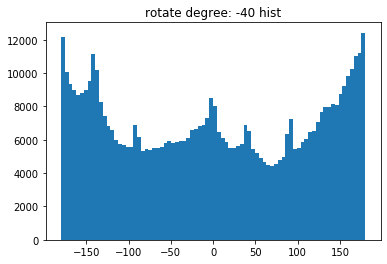

20968


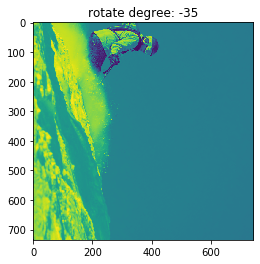

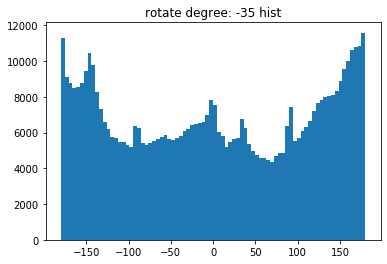

19849


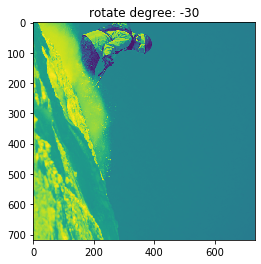

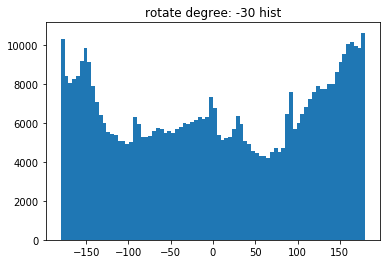

18869


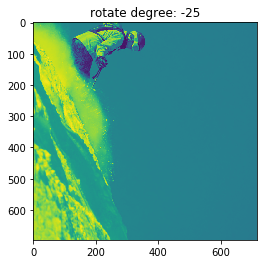

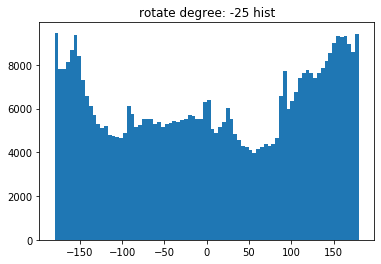

18076


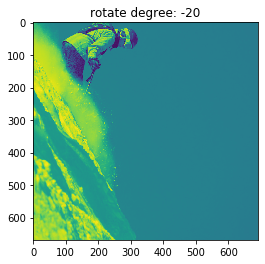

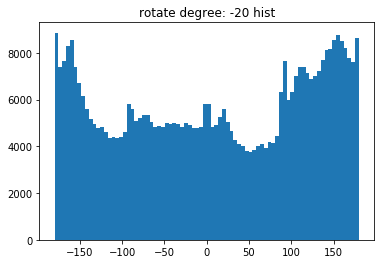

17579


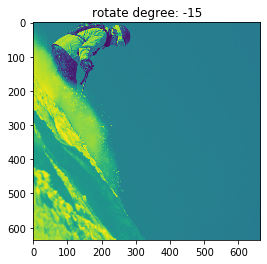

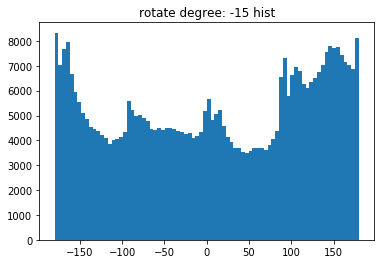

16635


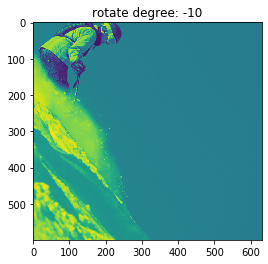

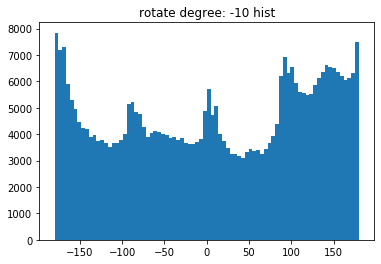

15687


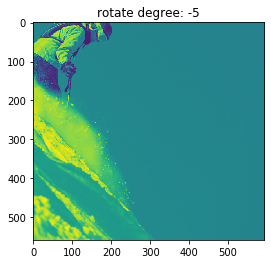

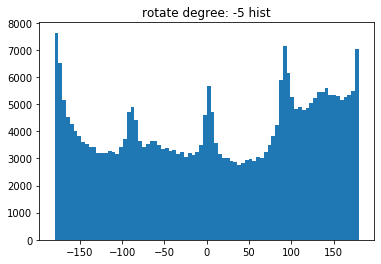

14833


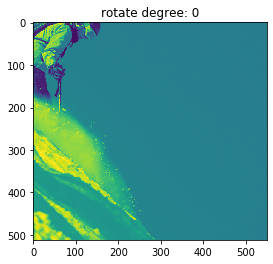

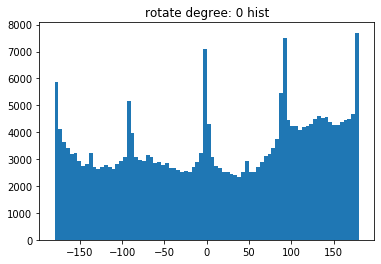

21054


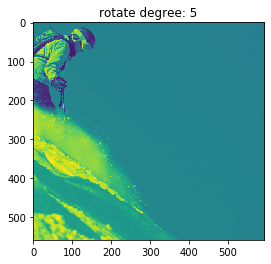

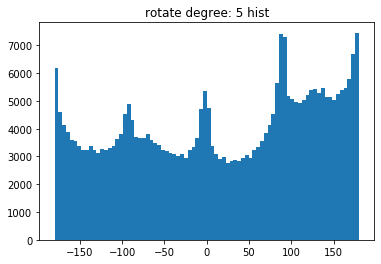

15303


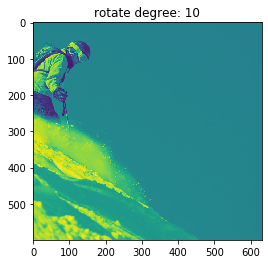

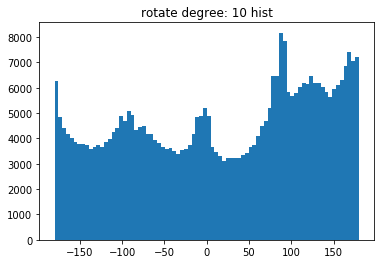

16052


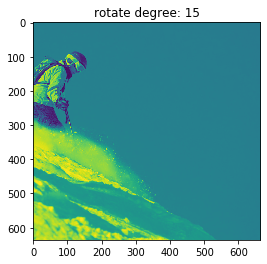

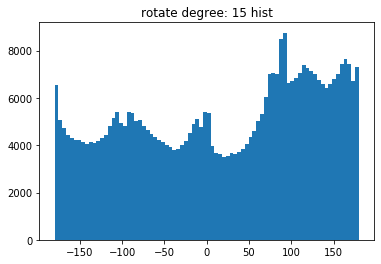

16981


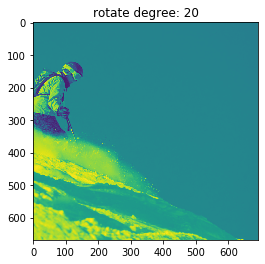

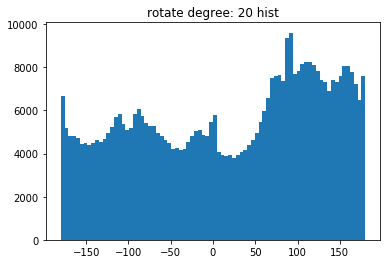

17876


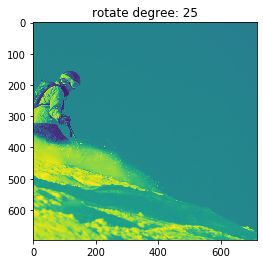

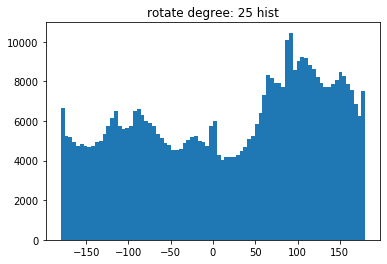

18903


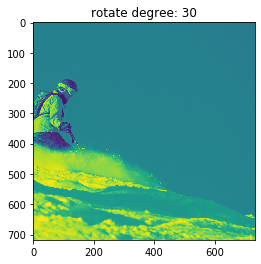

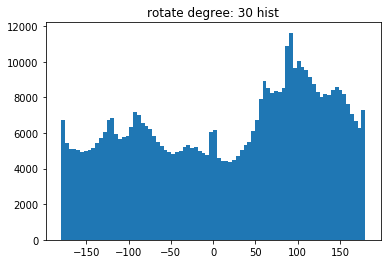

19790


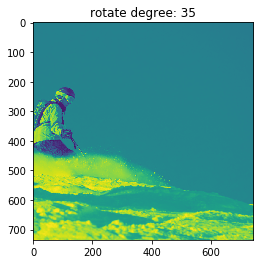

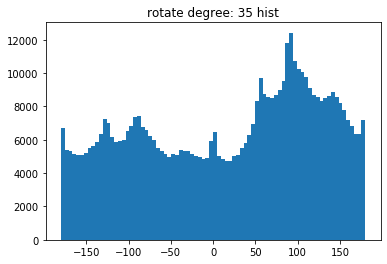

20148
Best angle:  0


In [25]:
rotated_ski = rotate(ski, rotate_range=[-40, 40], step=5)

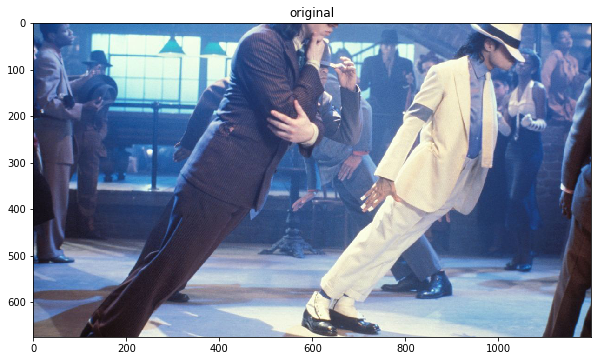

In [26]:
michael = 'michael.jpg'
michael = skio.imread(michael)
plt.figure(figsize=(10,10))
plt.title("original")
plt.imshow(michael)

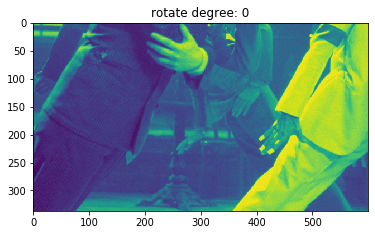

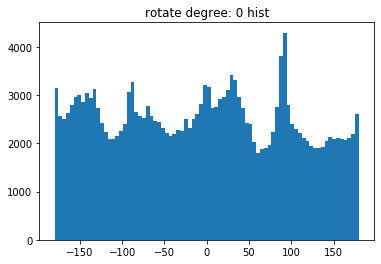

7239


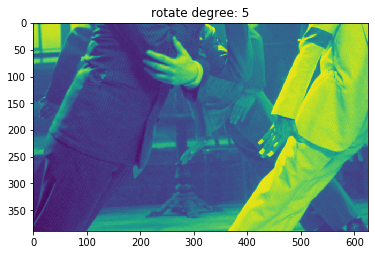

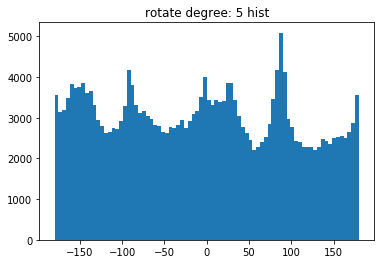

8470


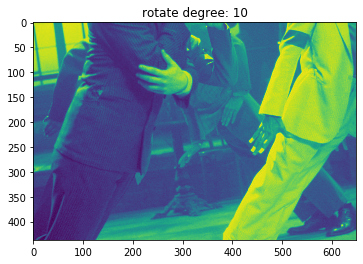

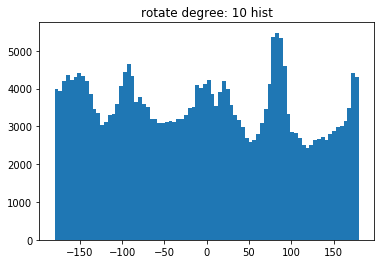

9258


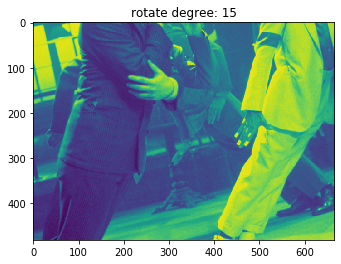

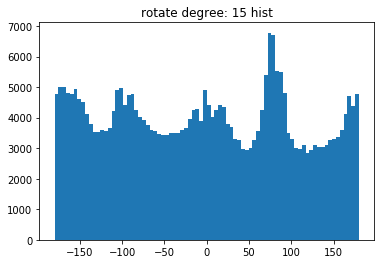

9946


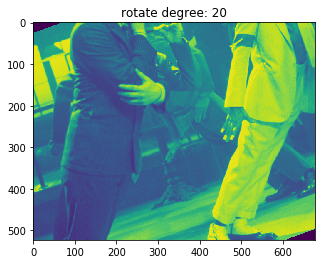

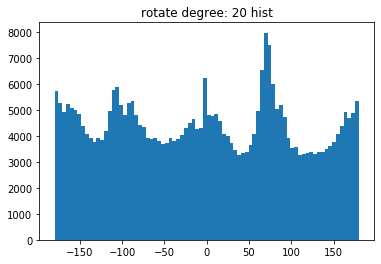

11811


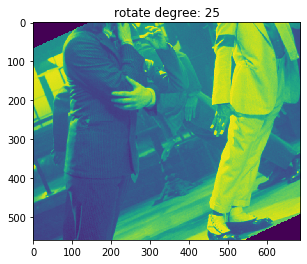

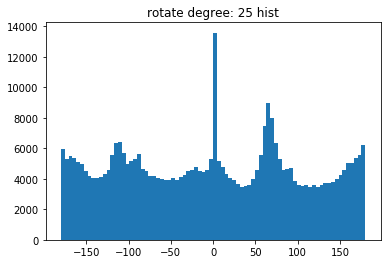

18952


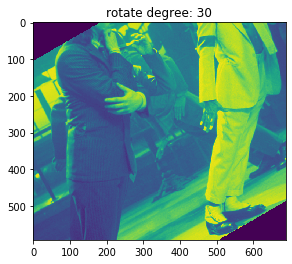

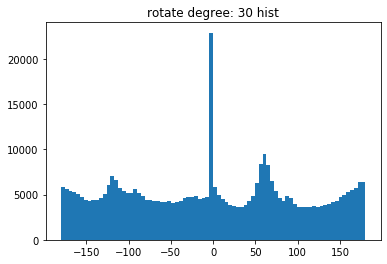

28018


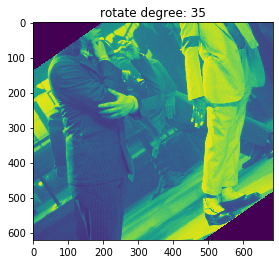

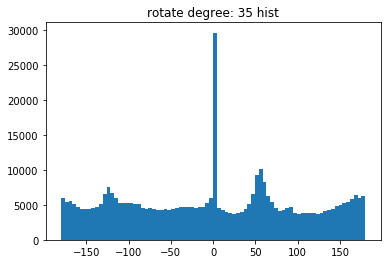

35013


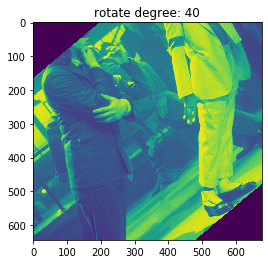

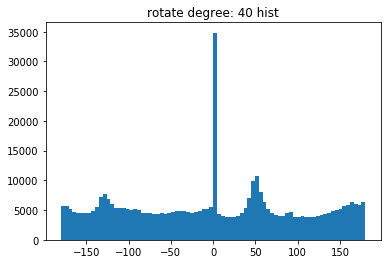

40150


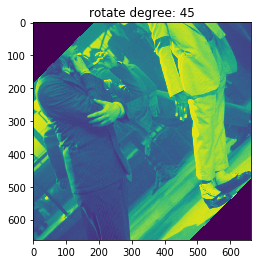

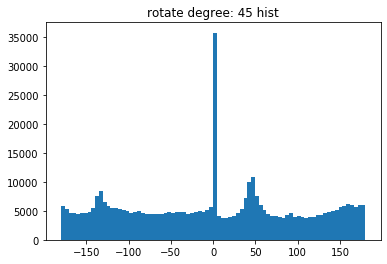

41178
Best angle:  45


In [27]:
rotated_michael = rotate(michael, rotate_range=[0,50], step=5)

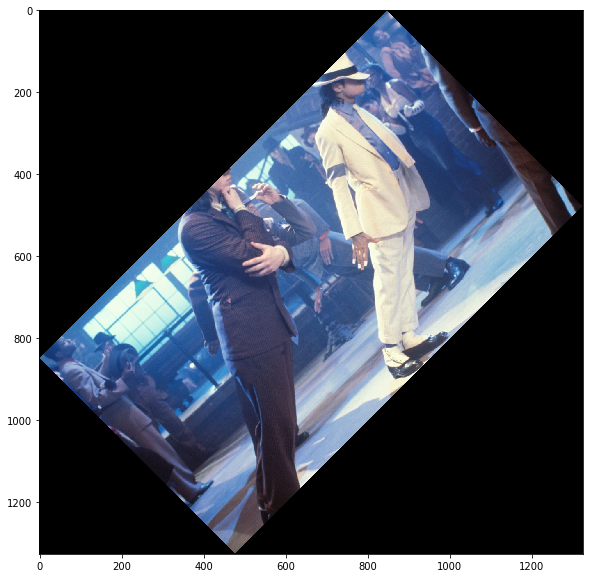

In [28]:
plt.figure(figsize=(10,10))
plt.imshow(rotated_michael)

### 2.1 Image "Sharpening"

In [29]:
def sharp(image, filter_size=5, alpha=1):
    gaussian = cv2.getGaussianKernel(filter_size, alpha)
    gaussian = gaussian*gaussian.T
    e = signal.unit_impulse((gaussian.shape[0], gaussian.shape[1]),'mid')
    sharpen_filter = (1+alpha)*e - (alpha*gaussian)
    low_pass_im_0 = signal.convolve2d(image[:,:,0], sharpen_filter, mode='same') 
    low_pass_im_1 = signal.convolve2d(image[:,:,1], sharpen_filter, mode='same') 
    low_pass_im_2 = signal.convolve2d(image[:,:,2], sharpen_filter, mode='same')
    low_pass_im = np.dstack([low_pass_im_0, low_pass_im_1, low_pass_im_2])
    return low_pass_im

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


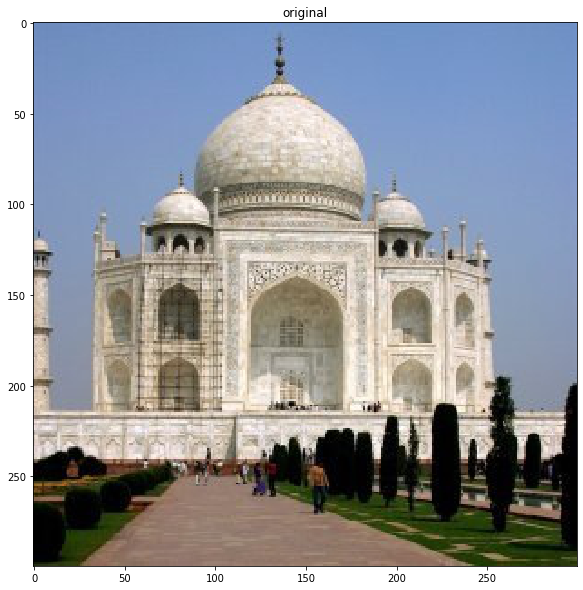

In [30]:
taj = plt.imread('./taj.jpg')/255
plt.figure(figsize=(10,10))
plt.title('original')
plt.imshow(taj)
io.imsave('original_taj.jpg', taj)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Lossy conversion from float64 to uint8. Range [-0.44567918287535846, 1.335775470154617]. Convert image to uint8 prior to saving to suppress this warning.


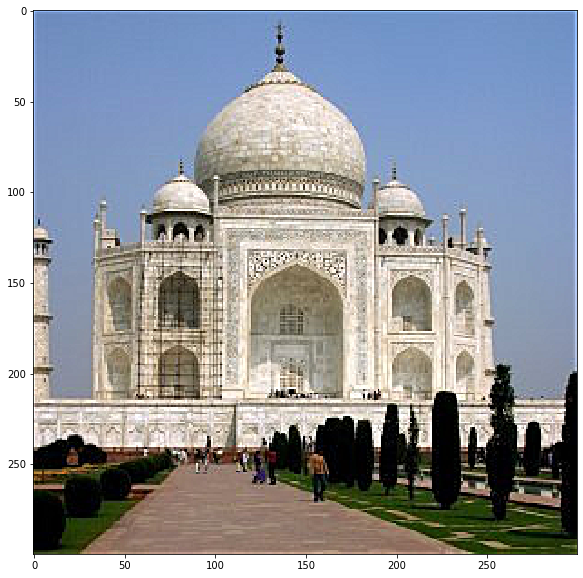

In [31]:
taj = plt.imread('./taj.jpg')/255
sharp_taj = sharp(taj)
plt.figure(figsize=(10,10))
plt.imshow(sharp_taj)
io.imsave('sharp_taj.jpg', sharp_taj)

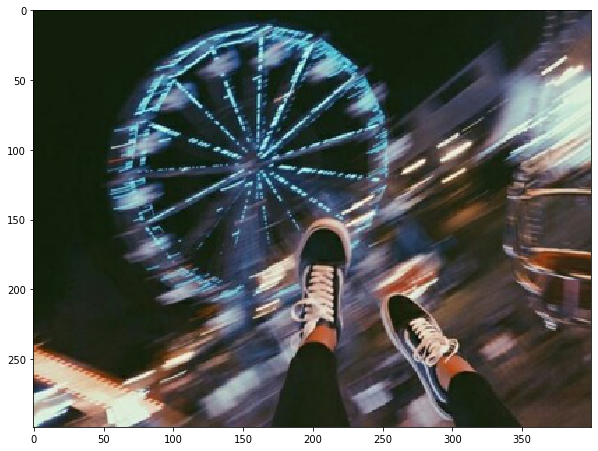

In [32]:
ferry = plt.imread('./blur_ferry.jpg')/255
plt.figure(figsize=(10,10))
plt.imshow(ferry)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Lossy conversion from float64 to uint8. Range [-0.23014961421948807, 1.4548388853024425]. Convert image to uint8 prior to saving to suppress this warning.


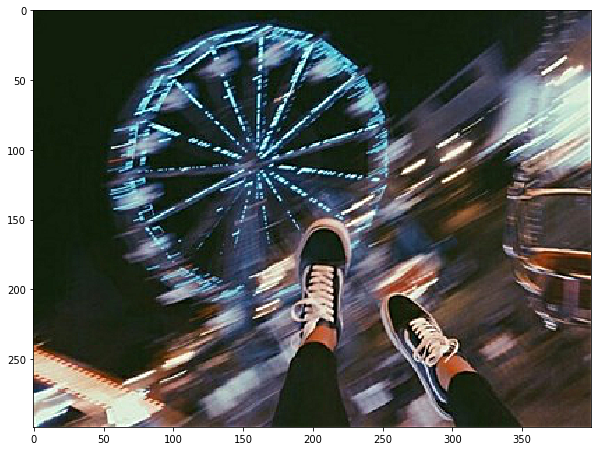

In [33]:
sharp_ferry = sharp(ferry)
plt.figure(figsize=(10,10))
plt.imshow(sharp_ferry)
io.imsave('sharp_ferry.jpg', sharp_ferry)

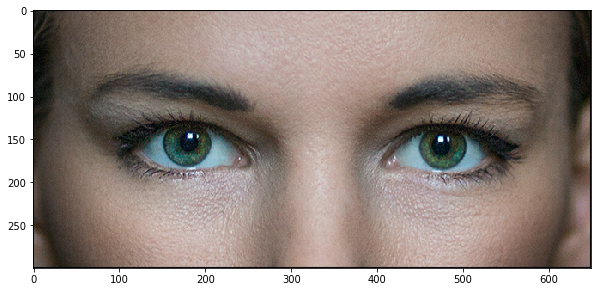

In [34]:
eye = plt.imread('./sharp.jpg')/255
plt.figure(figsize=(10,10))
plt.imshow(eye)

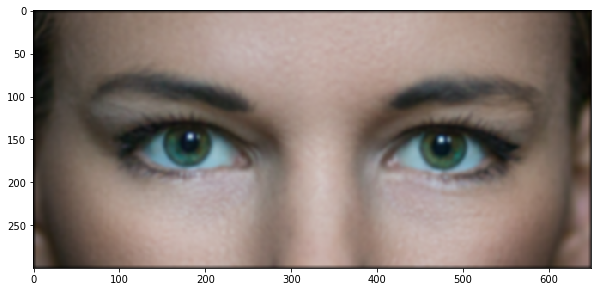

In [35]:
blur_filter = make_gaussian_filter(8, sigma=2)
r = signal.convolve2d(eye[:, :, 0], blur_filter, mode='same')
g = signal.convolve2d(eye[:, :, 1], blur_filter, mode='same')
b = signal.convolve2d(eye[:, :, 2], blur_filter, mode='same')
blurred_eye = np.dstack([r, g, b])
plt.figure(figsize=(10,10))
plt.imshow(blurred_eye)

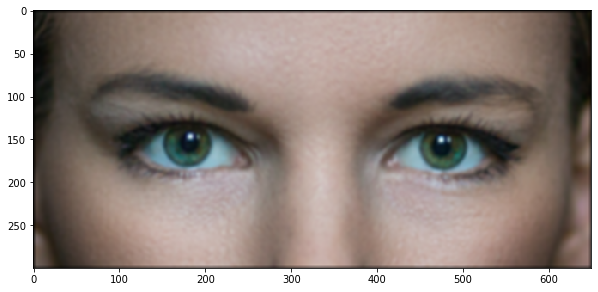

In [36]:
sharp_back = sharp(blurred_eye)
plt.figure(figsize=(10,10))
plt.imshow(sharp_back)